In [20]:
%matplotlib inline
import numpy as np
import pandas as pd
import os
import dicom
from glob import glob
from tqdm import tqdm
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from skimage import morphology
from skimage import measure
from skimage.transform import resize

DSB_DATA_PATH = '../../../data/dsb/'
STAGE1_PATH = DSB_DATA_PATH + 'stage1/'
OUTPUT_PATH = '../../../output/rev2/'

def read_ct_scan(folder_name):
        slices = [dicom.read_file(folder_name + filename) for filename in os.listdir(folder_name)]
        slices.sort(key=lambda x: int(x.InstanceNumber))
        slices = np.stack([s.pixel_array for s in slices])
        slices[slices == -2000] = 0
        return slices

In [51]:
# goal: create preprocess pipeline, and run segmenter

ct_scan = read_ct_scan(STAGE1_PATH + '00cba091fa4ad62cc3200a657aeb957e/')

In [7]:
print(ct_scan.shape)

(134, 512, 512)


In [21]:
def preprocess(patient_path, patientid):
    ct_scan = read_ct_scan(patient_path)
    segmented_ct_scan = np.ndarray(ct_scan.shape,dtype=np.float32)
    for i, img in enumerate(ct_scan):
        mean = np.mean(img)
        std = np.std(img)
        img = img-mean
        img = img/std
        # Find the average pixel value near the lungs
        # to renormalize washed out images
        middle = img[100:400,100:400] 
        mean = np.mean(middle)  
        max = np.max(img)
        min = np.min(img)
        # To improve threshold finding, I'm moving the 
        # underflow and overflow on the pixel spectrum
        img[img==max]=mean
        img[img==min]=mean
        # Using Kmeans to separate foreground (radio-opaque tissue)
        # and background (radio transparent tissue ie lungs)
        # Doing this only on the center of the image to avoid 
        # the non-tissue parts of the image as much as possible
        kmeans = KMeans(n_clusters=2).fit(np.reshape(middle,[np.prod(middle.shape),1]))
        centers = sorted(kmeans.cluster_centers_.flatten())
        threshold = np.mean(centers)
        thresh_img = np.where(img<threshold,1.0,0.0)  # threshold the image
        # I found an initial erosion helful for removing graininess from some of the regions
        # and then large dialation is used to make the lung region 
        # engulf the vessels and incursions into the lung cavity by 
        # radio opaque tissue
        eroded = morphology.erosion(thresh_img,np.ones([4,4]))
        dilation = morphology.dilation(eroded,np.ones([10,10]))
        #  Label each region and obtain the region properties
        #  The background region is removed by removing regions 
        #  with a bbox that is to large in either dimnsion
        #  Also, the lungs are generally far away from the top 
        #  and bottom of the image, so any regions that are too
        #  close to the top and bottom are removed
        #  This does not produce a perfect segmentation of the lungs
        #  from the image, but it is surprisingly good considering its
        #  simplicity. 
        labels = measure.label(dilation)
        label_vals = np.unique(labels)
        regions = measure.regionprops(labels)
        good_labels = []
        for prop in regions:
            B = prop.bbox
            if B[2]-B[0]<475 and B[3]-B[1]<475 and B[0]>40 and B[2]<472:
                good_labels.append(prop.label)
        mask = np.ndarray([512,512],dtype=np.int8)
        mask[:] = 0
        #  The mask here is the mask for the lungs--not the nodes
        #  After just the lungs are left, we do another large dilation
        #  in order to fill in and out the lung mask 
        for N in good_labels:
            mask = mask + np.where(labels==N,1,0)
        mask = morphology.dilation(mask,np.ones([10,10])) # one last dilation
        img = mask*img
        
        new_mean = np.mean(img[mask>0])  
        new_std = np.std(img[mask>0])
        old_min = np.min(img)
        img[img==old_min] = new_mean-1.2*new_std
        img = img-new_mean
        img = img/new_std
        
        labels = measure.label(mask)
        regions = measure.regionprops(labels)
        # Finding the global min and max row over all regions
        min_row = 512
        max_row = 0
        min_col = 512
        max_col = 0
        for prop in regions:
            B = prop.bbox
            if min_row > B[0]:
                min_row = B[0]
            if min_col > B[1]:
                min_col = B[1]
            if max_row < B[2]:
                max_row = B[2]
            if max_col < B[3]:
                max_col = B[3]
        width = max_col-min_col
        height = max_row - min_row
        if width > height:
            max_row=min_row+width
        else:
            max_col = min_col+height
        # cropping the image down to the bounding box for all regions
        # (there's probably an skimage command that can do this in one line)
        img = img[min_row:max_row,min_col:max_col]
        
        mean = np.mean(img)
        img = img - mean
        min = np.min(img)
        max = np.max(img)
        img = img/(max-min)
        new_img = resize(img,[512,512])
        segmented_ct_scan[i] = new_img
    np.save(OUTPUT_PATH + patientid, segmented_ct_scan)

# for all the folders, feed each folder to the function, save the final array under the id of the folder name
FOLDER_LIST = os.listdir(STAGE1_PATH)
for patientid in tqdm(FOLDER_LIST):
    patient_path = STAGE1_PATH + patientid + '/'
    preprocess(patient_path, patientid)
    break

  0%|                                                                                         | 0/1595 [00:00<?, ?it/s]

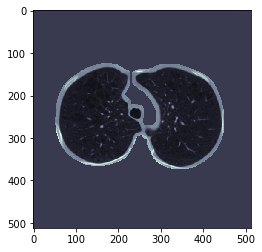

In [37]:
preprocess(ct_scan)

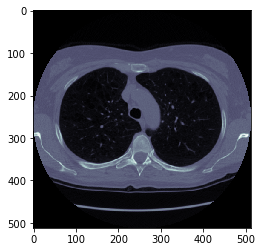

In [24]:
plt.imshow(ct_scan[30], cmap=plt.cm.bone)

In [2]:
FOLDER_LIST = os.listdir(STAGE1_PATH)
ct_scan = np.load(OUTPUT_PATH + FOLDER_LIST[0] + '.npy')

In [3]:
print(ct_scan.shape)

(195, 512, 512)


In [12]:
def plot_ct_scan(scan):
    f, plots = plt.subplots(int(scan.shape[0] / 20) + 1, 4, figsize=(100, 100))
    for i in range(0, scan.shape[0], 5):
        plots[int(i / 20), int((i % 20) / 5)].axis('off')
        plots[int(i / 20), int((i % 20) / 5)].imshow(scan[i], cmap=plt.cm.bone) 

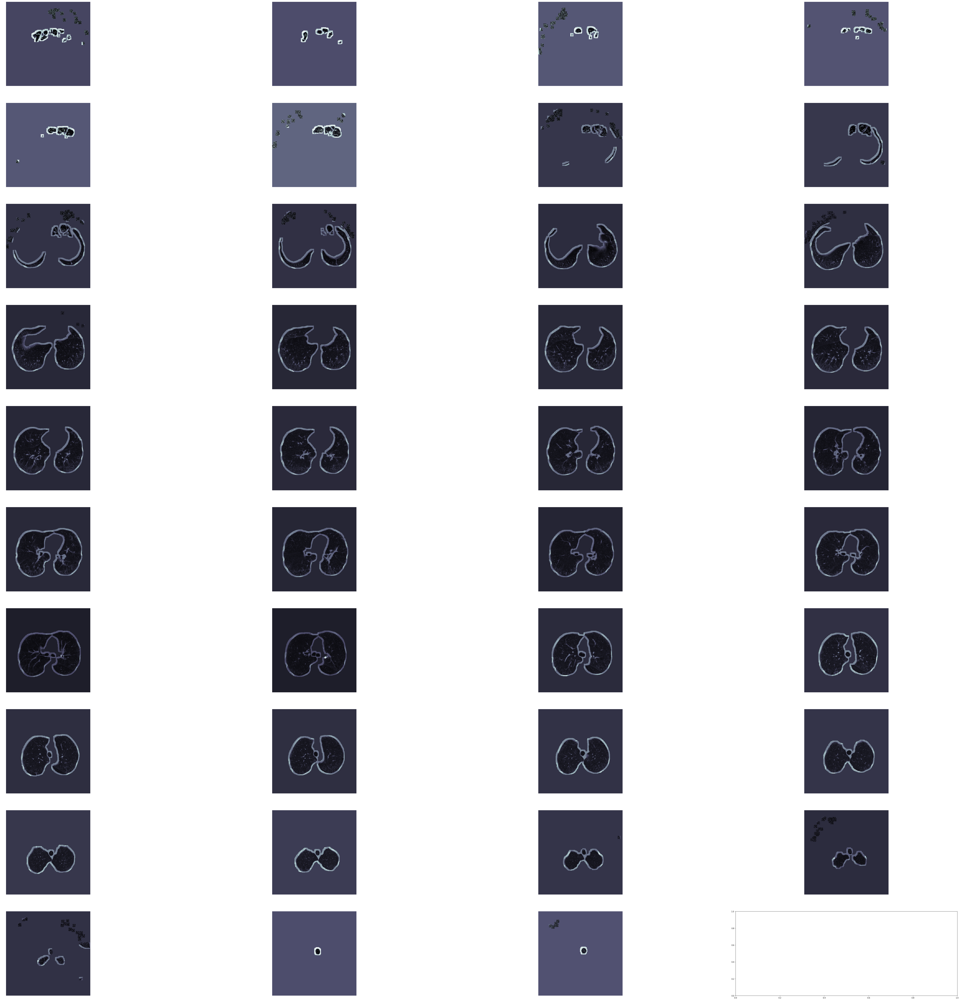

In [13]:
plot_ct_scan(ct_scan)

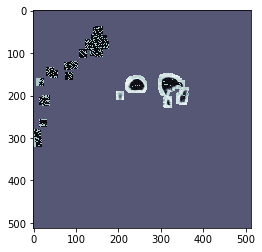

In [16]:
plt.imshow(ct_scan[10], cmap=plt.cm.bone)

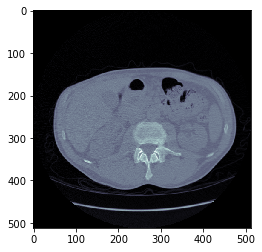

In [17]:
ct_scan = read_ct_scan(STAGE1_PATH + '0015ceb851d7251b8f399e39779d1e7d/')
plt.imshow(ct_scan[10], cmap=plt.cm.bone)

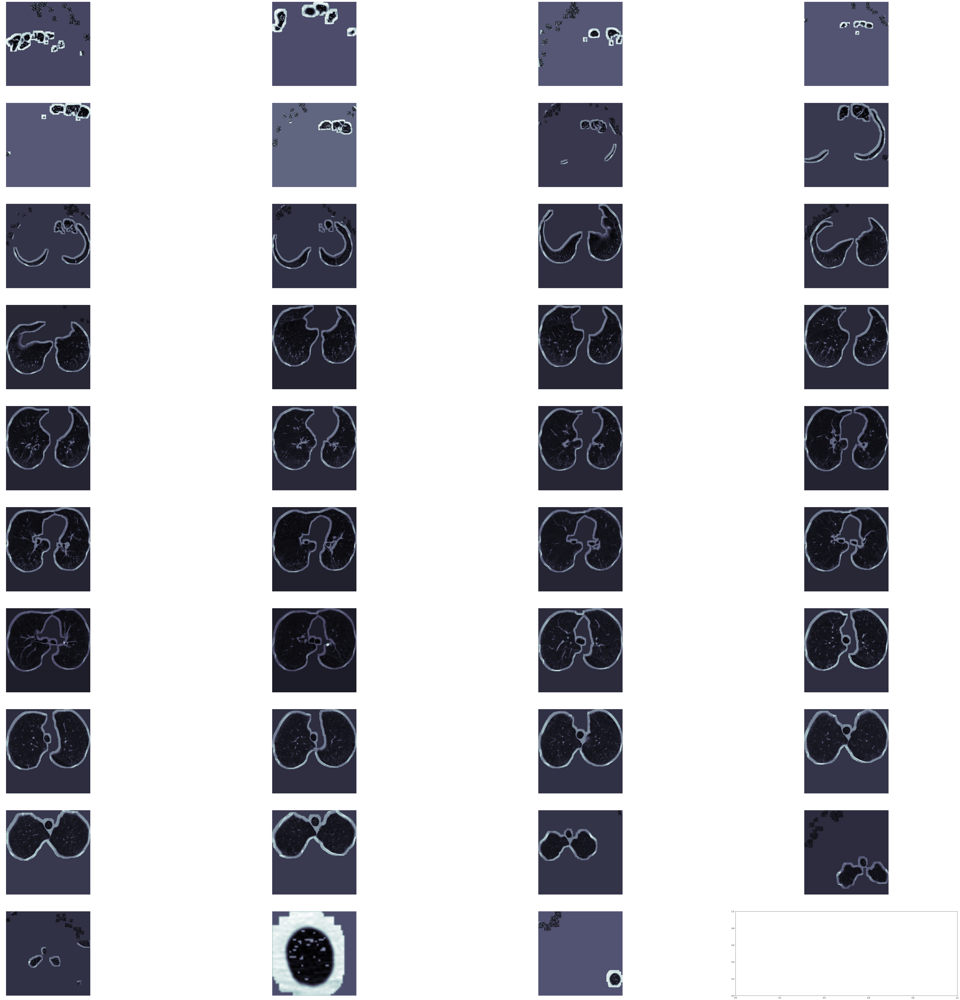

In [22]:
ct_scan = np.load(OUTPUT_PATH + '0015ceb851d7251b8f399e39779d1e7d.npy')
plot_ct_scan(ct_scan)

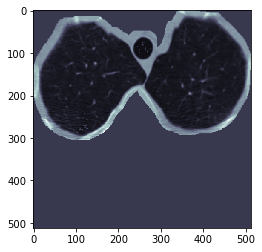

In [27]:
plt.imshow(ct_scan[160], cmap=plt.cm.bone)

In [ ]:
ct_scan
# now that it is preprocessed, you need to feed it to segmenter and save the masked version
# understand what the files the classifier requires in order to classify (it seems as if it only needs 1 type of file)
# ether mask or mask on it 

In [35]:
# look for where it is greater than 0.4
# if it is greater, set that value to 1
# if not greater set it to 0 
slice_npy = [[0.1, 0, 1], [1, 1, 1], [0, 0, 0]]
thr = np.where(slice_npy > np.mean(slice_npy),0.,1.0) 
print(np.mean(slice_npy))
print(thr)
slice_npy = [[0.1, 0, 1], [1, 1, 1], [0, 0, 0]]
thr = np.where(slice_npy > 2,0.,1.0) # look for where it is greater than 
print(np.mean(slice_npy))
print(thr)

# what is the applied use for this? and does it indicate you need only mask, or overlaid masK?

0.455555555556
[[ 1.  1.  0.]
 [ 0.  0.  0.]
 [ 1.  1.  1.]]


TypeError: unorderable types: list() > int()

In [44]:
from skimage import measure
labeled = measure.label(thr)
print(labeled)
print(labeled.astype(int))
regions = measure.regionprops(labeled)
print(regions) 

[[1 1 0]
 [0 0 0]
 [2 2 2]]
[[1 1 0]
 [0 0 0]
 [2 2 2]]
[<skimage.measure._regionprops._RegionProperties object at 0x000001C44DCB7908>, <skimage.measure._regionprops._RegionProperties object at 0x000001C4640AFC18>]


In [ ]:
# the conclusion is that you need the overlaid mask, because even when you threshold at the average, 
# there are so many 0s that the average is very low (so the nodule is a good region, and some more background is removed)
# modify code to run segmenter on the individual segmented layer, and save the mask*img only

%matplotlib inline
import numpy as np
import pandas as pd
import os
import dicom
from glob import glob
from tqdm import tqdm
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans
from skimage import morphology
from skimage import measure
from skimage.transform import resize

DSB_DATA_PATH = '../../../data/dsb/'
STAGE1_PATH = DSB_DATA_PATH + 'stage1/'
OUTPUT_PATH = '../../../output/rev2/'

def read_ct_scan(folder_name):
        slices = [dicom.read_file(folder_name + filename) for filename in os.listdir(folder_name)]
        slices.sort(key=lambda x: int(x.InstanceNumber))
        slices = np.stack([s.pixel_array for s in slices])
        slices[slices == -2000] = 0
        return slices

def preprocess(patient_path, patientid):
    ct_scan = read_ct_scan(patient_path)
    segmented_ct_scan = np.ndarray(ct_scan.shape,dtype=np.float32)
    for i, img in enumerate(ct_scan):
        mean = np.mean(img)
        std = np.std(img)
        img = img-mean
        img = img/std
        # Find the average pixel value near the lungs
        # to renormalize washed out images
        middle = img[100:400,100:400] 
        mean = np.mean(middle)  
        max = np.max(img)
        min = np.min(img)
        # To improve threshold finding, I'm moving the 
        # underflow and overflow on the pixel spectrum
        img[img==max]=mean
        img[img==min]=mean
        # Using Kmeans to separate foreground (radio-opaque tissue)
        # and background (radio transparent tissue ie lungs)
        # Doing this only on the center of the image to avoid 
        # the non-tissue parts of the image as much as possible
        kmeans = KMeans(n_clusters=2).fit(np.reshape(middle,[np.prod(middle.shape),1]))
        centers = sorted(kmeans.cluster_centers_.flatten())
        threshold = np.mean(centers)
        thresh_img = np.where(img<threshold,1.0,0.0)  # threshold the image
        # I found an initial erosion helful for removing graininess from some of the regions
        # and then large dialation is used to make the lung region 
        # engulf the vessels and incursions into the lung cavity by 
        # radio opaque tissue
        eroded = morphology.erosion(thresh_img,np.ones([4,4]))
        dilation = morphology.dilation(eroded,np.ones([10,10]))
        #  Label each region and obtain the region properties
        #  The background region is removed by removing regions 
        #  with a bbox that is to large in either dimnsion
        #  Also, the lungs are generally far away from the top 
        #  and bottom of the image, so any regions that are too
        #  close to the top and bottom are removed
        #  This does not produce a perfect segmentation of the lungs
        #  from the image, but it is surprisingly good considering its
        #  simplicity. 
        labels = measure.label(dilation)
        label_vals = np.unique(labels)
        regions = measure.regionprops(labels)
        good_labels = []
        for prop in regions:
            B = prop.bbox
            if B[2]-B[0]<475 and B[3]-B[1]<475 and B[0]>40 and B[2]<472:
                good_labels.append(prop.label)
        mask = np.ndarray([512,512],dtype=np.int8)
        mask[:] = 0
        #  The mask here is the mask for the lungs--not the nodes
        #  After just the lungs are left, we do another large dilation
        #  in order to fill in and out the lung mask 
        for N in good_labels:
            mask = mask + np.where(labels==N,1,0)
        mask = morphology.dilation(mask,np.ones([10,10])) # one last dilation
        img = mask*img
        
        new_mean = np.mean(img[mask>0])  
        new_std = np.std(img[mask>0])
        old_min = np.min(img)
        img[img==old_min] = new_mean-1.2*new_std
        img = img-new_mean
        img = img/new_std
        
        labels = measure.label(mask)
        regions = measure.regionprops(labels)
        # Finding the global min and max row over all regions
        min_row = 512
        max_row = 0
        min_col = 512
        max_col = 0
        for prop in regions:
            B = prop.bbox
            if min_row > B[0]:
                min_row = B[0]
            if min_col > B[1]:
                min_col = B[1]
            if max_row < B[2]:
                max_row = B[2]
            if max_col < B[3]:
                max_col = B[3]
        width = max_col-min_col
        height = max_row - min_row
        if width > height:
            max_row=min_row+width
        else:
            max_col = min_col+height
        # cropping the image down to the bounding box for all regions
        # (there's probably an skimage command that can do this in one line)
        img = img[min_row:max_row,min_col:max_col]
        
        mean = np.mean(img)
        img = img - mean
        min = np.min(img)
        max = np.max(img)
        img = img/(max-min)
        new_img = resize(img,[512,512])
        segmented_ct_scan[i] = new_img
    np.save(OUTPUT_PATH + patientid, segmented_ct_scan)

# for all the folders, feed each folder to the function, save the final array under the id of the folder name
FOLDER_LIST = os.listdir(STAGE1_PATH)
for patientid in tqdm(FOLDER_LIST):
    patient_path = STAGE1_PATH + patientid + '/'
    preprocess(patient_path, patientid)
    break




In [ ]:
# then using the data, create many different feature sets, thinking of different features, 
# and train classifier on multiple different sets of features, to determine best set of features